## ENUNCIADO EJERCICIO

* Dataset Airbnb NYC https://www.kaggle.com/datasets/dgomonov/new-york-city-airbnb-open-data AB_NYC_2019.csv
    * Quitar columnas: id, host_id, host_name
    * Fecha: probar a descomponer la fecha en campos año mes y día con pandas es decir, en 3 columnas, por ejemplo usando to_datetime de pandas y los accesores de fecha para extraer año mes y día.

* EDAs (10%) (menos foco para este módulo)
    * univariantes: histogramas boxplot countplot
    * bivariantes: scatterplot
    * multivariante: corr en heatmap, pairplot
* Preprocesados (20%)
    * numéricas: imputer, scaler, transformer
    * categóricas: imputer, encoder
    * Requisito: hacer los preprocesados con Scikit Learn en lugar de métodos de pandas
* clustering y siluetas (10 %)
    * Crear una columna cluster usando KMeans o cualquier otro algoritmo de Clustering
    * Usar esa columna para hacer algún gráfico EDA como hue para colorear con scatterplot
* feature selection (10%)
    * SelectKBest para filtrar las mejores columnas y probar
    * PCA 
* Regresión (20%):
    * Predecir la columna 'price'
* Clasificación multiclase (20%)
    * Predecir la columna 'room_type'
* Comparar resultados de modelos con validación cruzada (10 %)
    * Mostrar un dataframe de resultados con las métricas calculadas
    * Opcional: mostrar boxplot de los resultados de validación cruzada como tiempos de ejecución y predicción y métricas

* Opcional:
    * Uso de pipelines opcional:
        * Opción 1: hacer las transformaciones por separado manualmente
        * Opción 2: hacer las transformaciones con pipelines
        * Opción 3: una primera parte con transformaciones manuales y una segunda parte con Pipeline
        * En ambos casos sería interesante calcular las métricas para ver qué técnicas de preprocesado van mejor
    * Vectorizar la columna texto 'name' y usar TruncatedSVD
    * Clasificación multiclase 'room_type' o regresión sobre price con TensorFlow-Keras
    * SMOTE si hay desbalanceo para el problema de clasificación multiclase 'room_type'

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Modelado y preprocesado con Scikit-Learn
from sklearn.model_selection import train_test_split, cross_validate
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder, PowerTransformer, StandardScaler, RobustScaler, QuantileTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.cluster import KMeans
from sklearn.metrics import (r2_score, mean_absolute_error, accuracy_score, 
                             mean_absolute_percentage_error, 
                             root_mean_squared_error, f1_score, precision_score,
                             recall_score, roc_auc_score, silhouette_score)
from sklearn.svm import SVR
from imblearn.over_sampling import SMOTE                 # Para balanceo de clases en clasificación
from collections import Counter


# Carga datos e investigación del dataset

In [4]:
df = pd.read_csv('airbnb_nyc_clean.csv')
df.head(3)

,id,name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,instant_bookable,...,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,False,...,966.0,193.0,10.0,9.0,2021-10-19,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,False,...,142.0,28.0,13.0,45.0,2022-05-21,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,unconfirmed,Elise,Manhattan,Harlem,40.80902,-73.94190,True,...,620.0,124.0,3.0,0.0,2019-06-14,0.79,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and..."


In [5]:
print("=== Información del DataFrame ===")
print(df.info())

=== Información del DataFrame ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69305 entries, 0 to 69304
Data columns (total 23 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              69305 non-null  int64  
 1   name                            69305 non-null  object 
 2   host_id                         69305 non-null  int64  
 3   host_identity_verified          69305 non-null  object 
 4   host_name                       69305 non-null  object 
 5   neighbourhood_group             69305 non-null  object 
 6   neighbourhood                   69305 non-null  object 
 7   lat                             69305 non-null  float64
 8   long                            69305 non-null  float64
 9   instant_bookable                69305 non-null  bool   
 10  cancellation_policy             69305 non-null  object 
 11  room_type                       69305 non-null  object 
 12

* Tratamiento de la fecha: descomponer en año, mes, día

In [6]:
# df['last_review'] = pd.to_datetime(df['last_review'], errors='coerce')
# df['last_review_year']  = df['last_review'].dt.year
# df['last_review_month'] = df['last_review'].dt.month
# df['last_review_day']   = df['last_review'].dt.day

* Vectorizar la columna name

In [7]:
# # Vectorizar la columna name
# tfidf_vect = TfidfVectorizer()
# X_tfidf_vectorized = tfidf_vect.fit_transform(df['name'])

# # Convertir la matriz a array denso
# tfidf_array = X_tfidf_vectorized.toarray()
# # Obtener los nombres de las características (palabras) del vectorizador
# tfidf_columns = tfidf_vect.get_feature_names_out()
# # Crear un DataFrame con estos datos
# tfidf_df = pd.DataFrame(tfidf_array, columns=tfidf_columns)
# # Concatenar este DataFrame con el original
# df = pd.concat([df, tfidf_df], axis=1)


* Borrado columnas que voy a considerar para este ejercicio, por ahora no relevantes

In [8]:
df = df.drop(['id','name','host_id','host_name','last_review', 'house_rules'], axis=1)
print(df.columns)

Index(['host_identity_verified', 'neighbourhood_group', 'neighbourhood', 'lat',
       'long', 'instant_bookable', 'cancellation_policy', 'room_type',
       'construction_year', 'price', 'service_fee', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month', 'review_rate_number',
       'calculated_host_listings_count', 'availability_365'],
      dtype='object')


* Busqueda de Nans

In [9]:
df.isna().sum()

host_identity_verified            0
neighbourhood_group               0
neighbourhood                     0
lat                               0
long                              0
instant_bookable                  0
cancellation_policy               0
room_type                         0
construction_year                 0
price                             0
service_fee                       0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
review_rate_number                0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

* Análisis de datos numéricos

In [10]:
df.describe()

,lat,long,construction_year,price,service_fee,minimum_nights,number_of_reviews,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365
count,69305.000000,69305.000000,69305.000000,69305.000000,69305.000000,69305.000000,69305.000000,69305.000000,69305.000000,69305.000000,69305.000000
mean,40.728070,-73.949036,2012.489503,624.736070,124.894026,4.620330,28.003896,1.301503,3.321636,8.976755,153.184287
std,0.055973,0.050470,5.756144,331.158937,66.222794,4.356887,52.035180,1.659188,1.255746,34.808447,134.421373
min,40.499790,-74.249840,2003.000000,50.000000,10.000000,0.000000,0.000000,0.010000,1.000000,1.000000,-10.000000
25%,40.688540,-73.982790,2008.000000,339.000000,68.000000,2.000000,1.000000,0.300000,2.000000,1.000000,18.000000
50%,40.722650,-73.954390,2012.000000,624.736070,124.894026,3.000000,7.000000,0.790000,3.000000,1.000000,127.000000
75%,40.762730,-73.931380,2017.000000,911.000000,182.000000,6.000000,30.000000,1.730000,4.000000,3.000000,281.000000
max,40.916970,-73.705220,2022.000000,1200.000000,240.000000,13.000000,1024.000000,90.000000,5.000000,332.000000,426.000000


* Análisis de variables a predecir:
    - Price (regresión)
    - Room_type (clasificación)

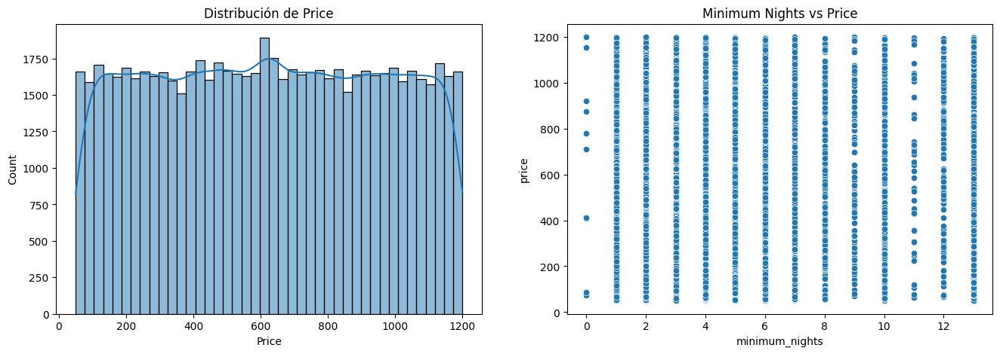

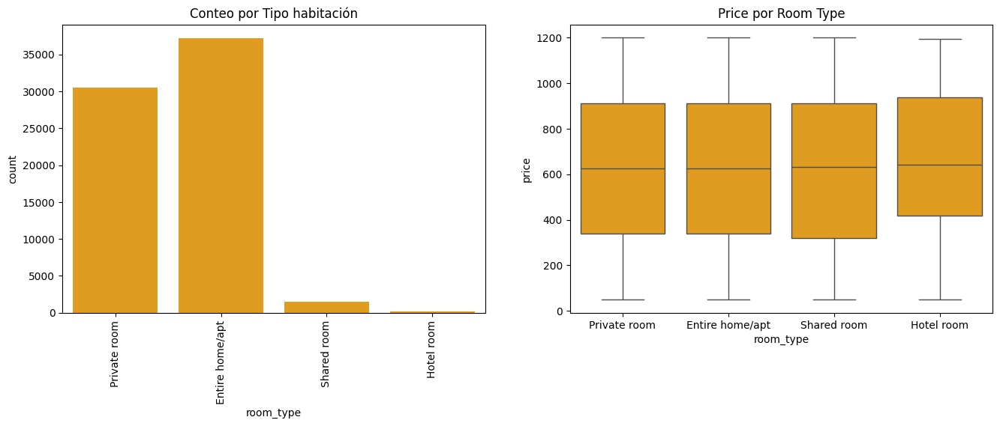

In [11]:
plt.figure(figsize=(16,5))
plt.subplot(1, 2, 1)
sns.histplot(df['price'], kde=True)
plt.title('Distribución de Price')
plt.xlabel('Price')
plt.subplot(1, 2, 2)
sns.scatterplot(x='minimum_nights', y='price', data=df)
plt.title('Minimum Nights vs Price')
plt.figure(figsize=(16, 5))
plt.subplot(1, 2, 1)
sns.countplot(x='room_type', data=df, color='orange')
plt.title('Conteo por Tipo habitación')
plt.xticks(rotation=90)
plt.subplot(1, 2, 2)
sns.boxplot(x='room_type', y='price', data=df, color='orange')
plt.title('Price por Room Type')
plt.show()



# Regresión

* Correlaciones

In [12]:
# Matriz correlación
df.corr(numeric_only=True).round(2)

,lat,long,instant_bookable,construction_year,price,service_fee,minimum_nights,number_of_reviews,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365
lat,1.00,0.06,0.0,0.00,-0.00,-0.00,0.04,-0.03,-0.02,-0.00,0.04,-0.00
long,0.06,1.00,-0.0,0.00,0.01,0.00,-0.10,0.06,0.11,0.02,-0.11,0.05
instant_bookable,0.00,-0.00,1.0,0.00,-0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00
construction_year,0.00,0.00,0.0,1.00,-0.00,-0.00,-0.00,0.00,0.01,0.01,-0.00,-0.00
price,-0.00,0.01,-0.0,-0.00,1.00,1.00,-0.00,0.01,0.01,-0.00,0.00,-0.00
service_fee,-0.00,0.00,0.0,-0.00,1.00,1.00,-0.00,0.01,0.00,-0.00,0.00,-0.00
minimum_nights,0.04,-0.10,-0.0,-0.00,-0.00,-0.00,1.00,-0.13,-0.27,0.02,0.23,0.07
number_of_reviews,-0.03,0.06,0.0,0.00,0.01,0.01,-0.13,1.00,0.55,-0.01,-0.08,0.07
reviews_per_month,-0.02,0.11,-0.0,0.01,0.01,0.00,-0.27,0.55,1.00,0.03,-0.04,0.04
review_rate_number,-0.00,0.02,0.0,0.01,-0.00,-0.00,0.02,-0.01,0.03,1.00,0.02,-0.01


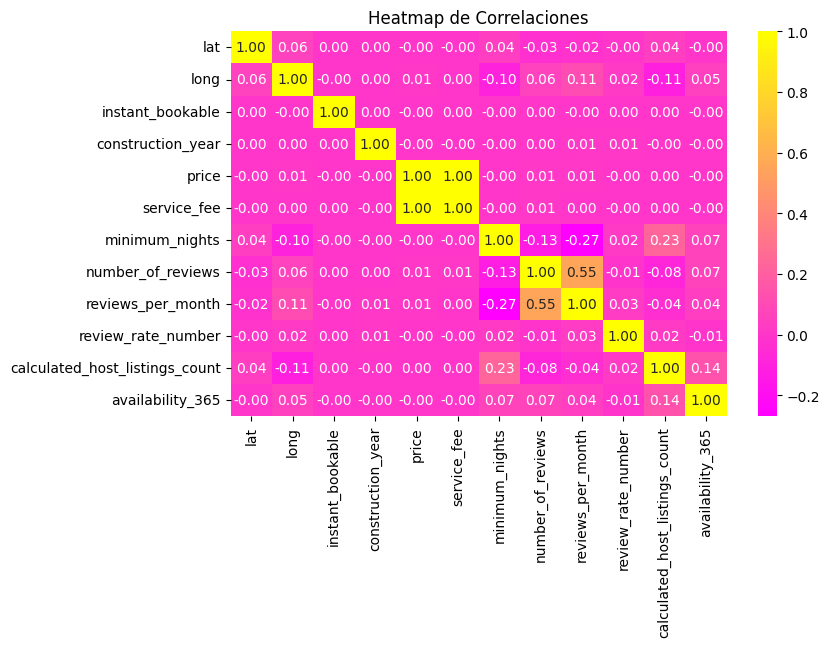

In [13]:
# Heatmap
plt.figure(figsize=(8, 5))
sns.heatmap(df.corr(numeric_only=True).round(2), annot=True, cmap='spring', fmt=".2f")
plt.title('Heatmap de Correlaciones')
plt.show()

* Pairplot

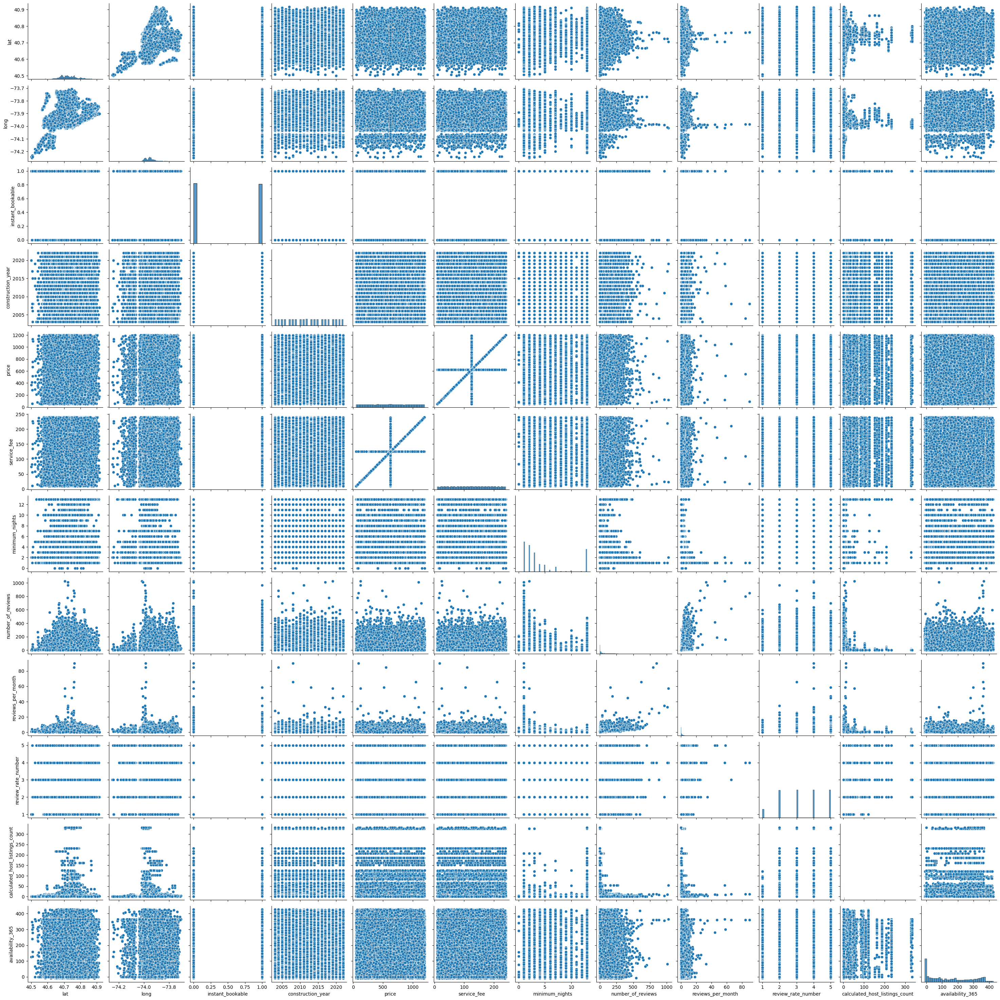

In [14]:
sns.pairplot(df)

## Preprocesamiento

### Imputer (Tratamiento de Nans)

In [15]:
numerical_cols = df.select_dtypes(include=[np.number]).columns
categorical_cols = df.select_dtypes(exclude=[np.number]).columns

imputer_num = SimpleImputer(strategy='mean')
df_numerical = imputer_num.fit_transform(df[numerical_cols])

imputer_cat = SimpleImputer(strategy='constant', fill_value='Other')
df_categorical = imputer_cat.fit_transform(df[categorical_cols])

df_categorical_df = pd.DataFrame(df_categorical, columns=categorical_cols, index=df.index)

df_numerical_df = pd.DataFrame(df_numerical, columns=numerical_cols, index=df.index)

df = pd.concat([df_numerical_df, df_categorical_df], axis=1).astype(df.dtypes.to_dict())

print(df.isna().sum())
df.info()


lat                               0
long                              0
construction_year                 0
price                             0
service_fee                       0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
review_rate_number                0
calculated_host_listings_count    0
availability_365                  0
host_identity_verified            0
neighbourhood_group               0
neighbourhood                     0
instant_bookable                  0
cancellation_policy               0
room_type                         0
dtype: int64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69305 entries, 0 to 69304
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   lat                             69305 non-null  float64
 1   long                            69305 non-null  float64
 2   construction_year

* Outlier

In [16]:
Q1 = df['price'].quantile(0.25)
Q3 = df['price'].quantile(0.75)
IQR = Q3 - Q1
lower_bound= Q1 - 1.5*IQR
upper_bound= Q3 + 1.5*IQR

filtro = filtro = ~((df['price'] < lower_bound) | (df['price'] > upper_bound))
print(df.shape)
print(df[filtro].shape)
#df = df[filtro]


(69305, 17)
(69305, 17)


### Encoder

In [17]:
df_cla = df.copy()
df_cla.head()

,lat,long,construction_year,price,service_fee,minimum_nights,number_of_reviews,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,host_identity_verified,neighbourhood_group,neighbourhood,instant_bookable,cancellation_policy,room_type
0,40.64749,-73.97237,2020.0,966.0,193.0,10.0,9.0,0.21,4.0,6.0,286.0,unconfirmed,Brooklyn,Kensington,False,strict,Private room
1,40.75362,-73.98377,2007.0,142.0,28.0,13.0,45.0,0.38,4.0,2.0,228.0,verified,Manhattan,Midtown,False,moderate,Entire home/apt
2,40.80902,-73.94190,2005.0,620.0,124.0,3.0,0.0,0.79,5.0,1.0,352.0,unconfirmed,Manhattan,Harlem,True,flexible,Private room
3,40.68514,-73.95976,2005.0,368.0,74.0,13.0,270.0,4.64,4.0,1.0,322.0,unconfirmed,Brooklyn,Clinton Hill,True,moderate,Entire home/apt
4,40.79851,-73.94399,2009.0,204.0,41.0,10.0,9.0,0.10,3.0,1.0,289.0,verified,Manhattan,East Harlem,False,moderate,Entire home/apt


In [18]:
numerical_columns = df.select_dtypes(exclude=['object', 'category']).columns.to_list() # np.number alternativa
categorical_columns = df.select_dtypes(include=['object', 'category']).columns.to_list()

encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore') 
df_encoded = encoder.fit_transform(df[categorical_columns]) 

df = pd.concat(
    [
        pd.DataFrame(df_encoded, columns=encoder.get_feature_names_out()).reset_index(drop=True), # categoricas
        df[numerical_columns].reset_index(drop=True) # numéricas
    ],
    axis=1
)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69305 entries, 0 to 69304
Columns: 265 entries, host_identity_verified_unconfirmed to instant_bookable
dtypes: bool(1), float64(264)
memory usage: 139.7 MB


In [19]:
print(df.columns)

Index(['host_identity_verified_unconfirmed', 'host_identity_verified_verified',
       'neighbourhood_group_Bronx', 'neighbourhood_group_Brooklyn',
       'neighbourhood_group_Manhattan', 'neighbourhood_group_Queens',
       'neighbourhood_group_Staten Island', 'neighbourhood_21st Street',
       'neighbourhood_5th Avenue', 'neighbourhood_Allerton',
       ...
       'construction_year', 'price', 'service_fee', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month', 'review_rate_number',
       'calculated_host_listings_count', 'availability_365',
       'instant_bookable'],
      dtype='object', length=265)


In [20]:
kmeans = KMeans(n_clusters=5, random_state=42)
df['cluster'] = kmeans.fit_predict(df)
df['cluster'].unique()

array([1, 2, 4, 3, 0], dtype=int32)

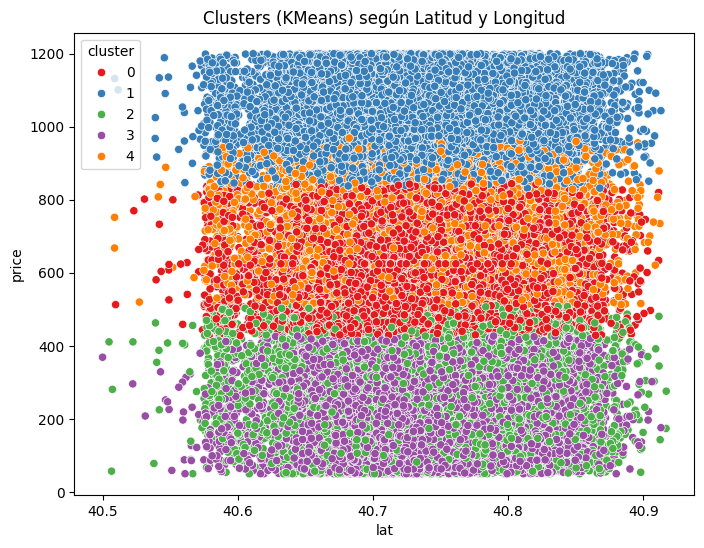

In [21]:
plt.figure(figsize=(8,6))
sns.scatterplot(x=df['lat'], y=df['price'], hue=df['cluster'], data=df, palette='Set1')
plt.title('Clusters (KMeans) según Latitud y Longitud')
plt.show()

In [22]:
numerical_cols

Index(['lat', 'long', 'construction_year', 'price', 'service_fee',
       'minimum_nights', 'number_of_reviews', 'reviews_per_month',
       'review_rate_number', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')

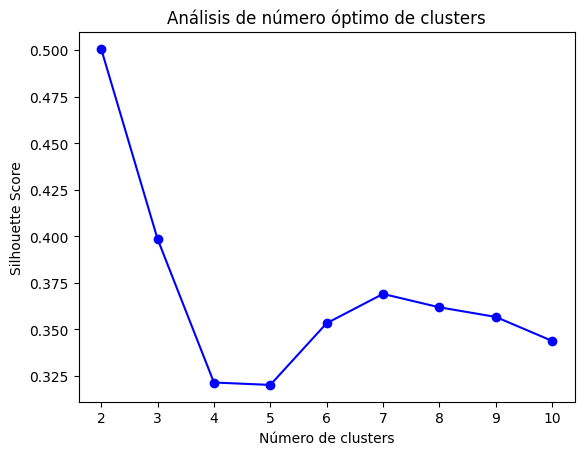

In [23]:
df_clus = df[numerical_cols]
silhouette_scores = []
k_range = range(2, 11)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    clusters = kmeans.fit_predict(df_clus)
    silhouette_scores.append(silhouette_score(df_clus, clusters))

# Visualizar resultados
plt.plot(k_range, silhouette_scores, 'bo-')
plt.xlabel('Número de clusters')
plt.ylabel('Silhouette Score')
plt.title('Análisis de número óptimo de clusters')
plt.show()

In [24]:
df_clus

,lat,long,construction_year,price,service_fee,minimum_nights,number_of_reviews,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365
0,40.64749,-73.97237,2020.0,966.00000,193.000000,10.0,9.0,0.21,4.0,6.0,286.0
1,40.75362,-73.98377,2007.0,142.00000,28.000000,13.0,45.0,0.38,4.0,2.0,228.0
2,40.80902,-73.94190,2005.0,620.00000,124.000000,3.0,0.0,0.79,5.0,1.0,352.0
3,40.68514,-73.95976,2005.0,368.00000,74.000000,13.0,270.0,4.64,4.0,1.0,322.0
4,40.79851,-73.94399,2009.0,204.00000,41.000000,10.0,9.0,0.10,3.0,1.0,289.0
...,...,...,...,...,...,...,...,...,...,...,...
69300,40.69370,-73.91006,2016.0,624.73607,124.894026,5.0,3.0,0.11,1.0,1.0,0.0
69301,40.71284,-73.96284,2005.0,624.73607,124.894026,7.0,15.0,0.55,4.0,1.0,0.0
69302,40.79563,-73.97634,2010.0,624.73607,124.894026,3.0,38.0,1.40,3.0,1.0,31.0
69303,40.76125,-73.98945,2020.0,624.73607,124.894026,1.0,81.0,2.96,2.0,2.0,0.0


## Division de los datos

In [25]:

X= df.drop('price', axis=1)
y= df['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)


In [26]:
numeric_features = X_train.select_dtypes(include=['int64', 'float64']).columns.tolist()
X_numeric = X_train[numeric_features].fillna(0)
selector = SelectKBest(score_func=f_regression, k=25)
selector.fit(X_numeric, y_train)
cols_selected = X_numeric.columns[selector.get_support()]
print("\nVariables numéricas seleccionadas (SelectKBest para regresión):", list(cols_selected))


Variables numéricas seleccionadas (SelectKBest para regresión): ['neighbourhood_Bayside', 'neighbourhood_Belmont', 'neighbourhood_Breezy Point', 'neighbourhood_Concourse Village', 'neighbourhood_Crown Heights', 'neighbourhood_East Morrisania', 'neighbourhood_Flatbush', 'neighbourhood_Forest Hills', 'neighbourhood_Fresh Meadows', 'neighbourhood_Grand Street', 'neighbourhood_Jamaica Hills', 'neighbourhood_Kingsbridge', 'neighbourhood_Lighthouse Hill', 'neighbourhood_Midland Beach', 'neighbourhood_Midtown', 'neighbourhood_Morris Heights', 'neighbourhood_Oakwood', 'neighbourhood_Randall Manor', 'neighbourhood_Richmondtown', 'neighbourhood_Shore Acres', 'neighbourhood_Stapleton', 'neighbourhood_Washington Heights', 'neighbourhood_Woodrow', 'service_fee', 'number_of_reviews']


In [27]:
X_train_skb = X_numeric[cols_selected]
X_test_skb = X_test[cols_selected]

In [28]:
X_test_skb.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13861 entries, 35506 to 27417
Data columns (total 25 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   neighbourhood_Bayside             13861 non-null  float64
 1   neighbourhood_Belmont             13861 non-null  float64
 2   neighbourhood_Breezy Point        13861 non-null  float64
 3   neighbourhood_Concourse Village   13861 non-null  float64
 4   neighbourhood_Crown Heights       13861 non-null  float64
 5   neighbourhood_East Morrisania     13861 non-null  float64
 6   neighbourhood_Flatbush            13861 non-null  float64
 7   neighbourhood_Forest Hills        13861 non-null  float64
 8   neighbourhood_Fresh Meadows       13861 non-null  float64
 9   neighbourhood_Grand Street        13861 non-null  float64
 10  neighbourhood_Jamaica Hills       13861 non-null  float64
 11  neighbourhood_Kingsbridge         13861 non-null  float64
 12  neigh

In [29]:
df_resultados = pd.DataFrame(columns=['Modelo', 'Preprocesado', 'R2', 'MAE', 'RMSE', 'MAPE'])

In [30]:
def calculate(preprocessor_name, X_train, X_test, y_train, y_test):
    models = {
        'LinearRegression': LinearRegression(),
        'KNN': KNeighborsRegressor(),
        'SVR': SVR(),
        'DecisionTree': DecisionTreeRegressor(random_state=42),
        'RandomForest': RandomForestRegressor(random_state=42)
   }
    for model_name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        df_resultados.loc[len(df_resultados)] = [model_name, preprocessor_name, r2_score(y_test, y_pred), mean_absolute_error(y_test, y_pred),root_mean_squared_error(y_test, y_pred),mean_absolute_percentage_error(y_test, y_pred)]
    
    return df_resultados.sort_values('R2', ascending=False)

In [31]:
calculate('Sin preprocesado', X_train, X_test, y_train, y_test)


,Modelo,Preprocesado,R2,MAE,RMSE,MAPE
4,RandomForest,Sin preprocesado,0.999002,2.050787,10.445488,0.005038
3,DecisionTree,Sin preprocesado,0.998632,2.360280,12.232838,0.005797
0,LinearRegression,Sin preprocesado,0.994204,3.464723,25.176054,0.008859
1,KNN,Sin preprocesado,0.991601,10.617454,30.307757,0.029852
2,SVR,Sin preprocesado,0.512821,199.361005,230.825243,0.711182


In [32]:
calculate('Con SelectKBest', X_train_skb, X_test_skb, y_train, y_test)

,Modelo,Preprocesado,R2,MAE,RMSE,MAPE
4,RandomForest,Sin preprocesado,0.999002,2.050787,10.445488,0.005038
3,DecisionTree,Sin preprocesado,0.998632,2.360280,12.232838,0.005797
5,LinearRegression,Con SelectKBest,0.994213,3.060579,25.158249,0.007926
0,LinearRegression,Sin preprocesado,0.994204,3.464723,25.176054,0.008859
6,KNN,Con SelectKBest,0.993376,4.352268,26.915654,0.011634
9,RandomForest,Con SelectKBest,0.993072,3.895064,27.525316,0.010272
8,DecisionTree,Con SelectKBest,0.992379,3.913593,28.869688,0.010503
1,KNN,Sin preprocesado,0.991601,10.617454,30.307757,0.029852
7,SVR,Con SelectKBest,0.991575,6.084096,30.354922,0.023864
2,SVR,Sin preprocesado,0.512821,199.361005,230.825243,0.711182


In [33]:
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train_skb)
X_test_scaled = scaler.transform(X_test_skb)
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train_skb.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_train_skb.columns)

In [34]:
calculate('MinMaxScaler + skb', X_train_scaled, X_test_scaled, y_train, y_test)

,Modelo,Preprocesado,R2,MAE,RMSE,MAPE
4,RandomForest,Sin preprocesado,0.999002,2.050787,10.445488,0.005038
3,DecisionTree,Sin preprocesado,0.998632,2.360280,12.232838,0.005797
5,LinearRegression,Con SelectKBest,0.994213,3.060579,25.158249,0.007926
10,LinearRegression,MinMaxScaler + skb,0.994213,3.060579,25.158249,0.007926
0,LinearRegression,Sin preprocesado,0.994204,3.464723,25.176054,0.008859
6,KNN,Con SelectKBest,0.993376,4.352268,26.915654,0.011634
14,RandomForest,MinMaxScaler + skb,0.993073,3.894697,27.524975,0.010268
9,RandomForest,Con SelectKBest,0.993072,3.895064,27.525316,0.010272
11,KNN,MinMaxScaler + skb,0.992625,4.602662,28.400514,0.012560
13,DecisionTree,MinMaxScaler + skb,0.992379,3.913593,28.869688,0.010503


In [35]:
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_train.columns)

In [36]:
calculate('MinMaxScaler', X_train_scaled, X_test_scaled, y_train, y_test)

,Modelo,Preprocesado,R2,MAE,RMSE,MAPE
4,RandomForest,Sin preprocesado,0.999002,2.050787,10.445488,0.005038
19,RandomForest,MinMaxScaler,0.999001,2.052469,10.450021,0.005040
3,DecisionTree,Sin preprocesado,0.998632,2.360280,12.232838,0.005797
18,DecisionTree,MinMaxScaler,0.998629,2.364681,12.245715,0.005815
10,LinearRegression,MinMaxScaler + skb,0.994213,3.060579,25.158249,0.007926
5,LinearRegression,Con SelectKBest,0.994213,3.060579,25.158249,0.007926
0,LinearRegression,Sin preprocesado,0.994204,3.464723,25.176054,0.008859
15,LinearRegression,MinMaxScaler,0.994204,3.464723,25.176054,0.008859
6,KNN,Con SelectKBest,0.993376,4.352268,26.915654,0.011634
14,RandomForest,MinMaxScaler + skb,0.993073,3.894697,27.524975,0.010268


In [37]:
# model = RandomForestRegressor(random_state=42)

# params = {
#     'n_estimators': [100, 200, 300],
#     'max_depth': [None, 10, 20, 30],
#     'min_samples_split': [2, 5, 10],
#     'min_samples_leaf': [1, 2, 4],
#     'max_features': ['auto', 'sqrt', 'log2'],
#     'criterion': ['squared_error', 'absolute_error']
# }

# grid = GridSearchCV(model, params, scoring=['r2', 'neg_mean_absolute_error', 'neg_mean_squared_error', 'neg_mean_absolute_percentage_error', 'neg_root_mean_squared_error'], refit='neg_mean_absolute_error', verbose=1) # cv=5 por defecto
# grid.fit(X, y)


Tarda mucho!!!
![alt text](<Captura de pantalla 2025-02-21 104437.png>)

In [38]:
transformed = PowerTransformer()
X_train_tran = transformed.fit_transform(X_train_skb)
X_test_tran = transformed.transform(X_test_skb) 
X_train_tran = pd.DataFrame(X_train_tran, columns=X_train_skb.columns)
X_test_tran = pd.DataFrame(X_test_tran, columns=X_train_skb.columns)
X_train_tran.head(2)

,neighbourhood_Bayside,neighbourhood_Belmont,neighbourhood_Breezy Point,neighbourhood_Concourse Village,neighbourhood_Crown Heights,neighbourhood_East Morrisania,neighbourhood_Flatbush,neighbourhood_Forest Hills,neighbourhood_Fresh Meadows,neighbourhood_Grand Street,...,neighbourhood_Morris Heights,neighbourhood_Oakwood,neighbourhood_Randall Manor,neighbourhood_Richmondtown,neighbourhood_Shore Acres,neighbourhood_Stapleton,neighbourhood_Washington Heights,neighbourhood_Woodrow,service_fee,number_of_reviews
0,-0.035808,-0.022073,-0.010403,-0.02786,-0.179358,-0.014087,-0.111597,-0.054468,-0.028501,-0.004247,...,-0.020372,-0.012742,-0.02081,-0.006006,-0.015314,-0.024771,-0.130327,-0.004247,-0.693167,1.171176
1,-0.035808,-0.022073,-0.010403,-0.02786,-0.179358,-0.014087,-0.111597,-0.054468,-0.028501,-0.004247,...,-0.020372,-0.012742,-0.02081,-0.006006,-0.015314,-0.024771,-0.130327,-0.004247,0.445666,-1.497768


In [39]:
calculate('PowerTransformer', X_train_tran, X_test_tran, y_train, y_test)

,Modelo,Preprocesado,R2,MAE,RMSE,MAPE
4,RandomForest,Sin preprocesado,0.999002,2.050787,10.445488,0.005038
19,RandomForest,MinMaxScaler,0.999001,2.052469,10.450021,0.005040
3,DecisionTree,Sin preprocesado,0.998632,2.360280,12.232838,0.005797
18,DecisionTree,MinMaxScaler,0.998629,2.364681,12.245715,0.005815
5,LinearRegression,Con SelectKBest,0.994213,3.060579,25.158249,0.007926
10,LinearRegression,MinMaxScaler + skb,0.994213,3.060579,25.158249,0.007926
15,LinearRegression,MinMaxScaler,0.994204,3.464723,25.176054,0.008859
0,LinearRegression,Sin preprocesado,0.994204,3.464723,25.176054,0.008859
6,KNN,Con SelectKBest,0.993376,4.352268,26.915654,0.011634
24,RandomForest,PowerTransformer,0.993125,3.894444,27.419730,0.010252


In [40]:
print('skew antes: \n', X_train_skb.skew())
print('skew después: \n', X_train_tran.skew())

skew antes: 
 neighbourhood_Bayside                27.891662
neighbourhood_Belmont                45.283473
neighbourhood_Breezy Point           96.115382
neighbourhood_Concourse Village      35.867335
neighbourhood_Crown Heights           5.396239
neighbourhood_East Morrisania        70.976309
neighbourhood_Flatbush                8.849456
neighbourhood_Forest Hills           18.305580
neighbourhood_Fresh Meadows          35.059324
neighbourhood_Grand Street          235.465496
neighbourhood_Jamaica Hills          67.952803
neighbourhood_Kingsbridge            26.778576
neighbourhood_Lighthouse Hill       166.494744
neighbourhood_Midland Beach          78.471509
neighbourhood_Midtown                 5.221769
neighbourhood_Morris Heights         49.068721
neighbourhood_Oakwood                78.471509
neighbourhood_Randall Manor          48.034279
neighbourhood_Richmondtown          166.494744
neighbourhood_Shore Acres            65.285174
neighbourhood_Stapleton              40.345936

* Validación cruzada

In [41]:
model = LinearRegression()
results = cross_validate(model, X_train, y_train, 
               scoring=['r2', 'neg_mean_absolute_error', 'neg_mean_squared_error', 'neg_mean_absolute_percentage_error', 'neg_root_mean_squared_error']
)
print('fit_time', results['fit_time'].mean())
print('score_time', results['score_time'].mean())
print('test_r2', results['test_r2'].mean())
print('test_neg_mean_absolute_error', results['test_neg_mean_absolute_error'].mean())
print('test_neg_mean_squared_error', results['test_neg_mean_squared_error'].mean())
print('test_neg_mean_absolute_percentage_error', results['test_neg_mean_absolute_percentage_error'].mean())
print('test_neg_root_mean_squared_error', results['test_neg_root_mean_squared_error'].mean())

fit_time 0.8763140678405762
score_time 0.021881580352783203
test_r2 0.9941188582568998
test_neg_mean_absolute_error -3.572555067117166
test_neg_mean_squared_error -645.4401819934353
test_neg_mean_absolute_percentage_error -0.009316396656661518
test_neg_root_mean_squared_error -25.256191380838523


In [42]:
X= X_train
y= y_train
models = {
    'KNN': KNeighborsRegressor(),
    'RandomForest': RandomForestRegressor()
}

df_list = []
for name, model in models.items(): 
    
    results = cross_validate(model, X_train, y_train, cv=5, scoring=['r2', 'neg_mean_absolute_error', 'neg_mean_squared_error', 'neg_mean_absolute_percentage_error', 'neg_root_mean_squared_error'])
    df_model = pd.DataFrame(results)
    df_model['modelo'] = name
    df_list.append(df_model)

df_resultados = pd.concat(df_list, ignore_index=True)

Tarda mucho !!! ![alt text](<Captura de pantalla 2025-02-24 105110.png>)

In [43]:
df_resultados

,fit_time,score_time,test_r2,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error,modelo
0,0.161974,3.419556,0.992627,-11.057193,-816.483065,-0.032176,-28.574168,KNN
1,0.181508,3.223115,0.989858,-11.469858,-1110.673148,-0.032539,-33.326763,KNN
2,0.172940,3.319475,0.991787,-11.042674,-903.252157,-0.032001,-30.054154,KNN
3,0.177560,3.427670,0.990292,-11.533367,-1069.089708,-0.031795,-32.696937,KNN
4,0.158376,3.386046,0.992813,-11.037331,-778.042224,-0.031009,-27.893408,KNN
5,90.955834,0.360471,0.999196,-1.993653,-89.004926,-0.005007,-9.434242,RandomForest
6,94.246038,0.411919,0.998850,-2.103566,-125.945479,-0.005384,-11.222543,RandomForest
7,94.120670,0.346510,0.998741,-2.110551,-138.435608,-0.005206,-11.765866,RandomForest
8,87.303410,0.336574,0.998382,-2.262465,-178.216868,-0.005305,-13.349789,RandomForest
9,87.543804,0.333769,0.998774,-2.036773,-132.679655,-0.005023,-11.518666,RandomForest


In [44]:
df_pivot = df_resultados.groupby('modelo').mean().sort_values('test_r2', ascending=False)
df_pivot

,fit_time,score_time,test_r2,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error
modelo,,,,,,,
RandomForest,90.833951,0.357849,0.998789,-2.101402,-132.856507,-0.005185,-11.458221
KNN,0.170472,3.355172,0.991475,-11.228085,-935.508060,-0.031904,-30.509086


In [45]:
df_resultados_times = df_resultados[['modelo', 'fit_time', 'score_time']]
df_resultados_scores = df_resultados[['modelo', 'test_r2', 'test_neg_mean_absolute_error', 'test_neg_mean_squared_error', 'test_neg_mean_absolute_percentage_error', 'test_neg_root_mean_squared_error']]

In [46]:
# DATAFRAMES DE TIMES
df_times = df_resultados_times.melt(id_vars='modelo', var_name='time_type', value_name='time_seconds')
df_times.head(3)

,modelo,time_type,time_seconds
0,KNN,fit_time,0.161974
1,KNN,fit_time,0.181508
2,KNN,fit_time,0.172940


In [47]:
# DATAFRAMES DE SCORES
df_scores = df_resultados_scores.melt(id_vars='modelo', var_name='metric', value_name='score')
df_scores.head(3)

,modelo,metric,score
0,KNN,test_r2,0.992627
1,KNN,test_r2,0.989858
2,KNN,test_r2,0.991787


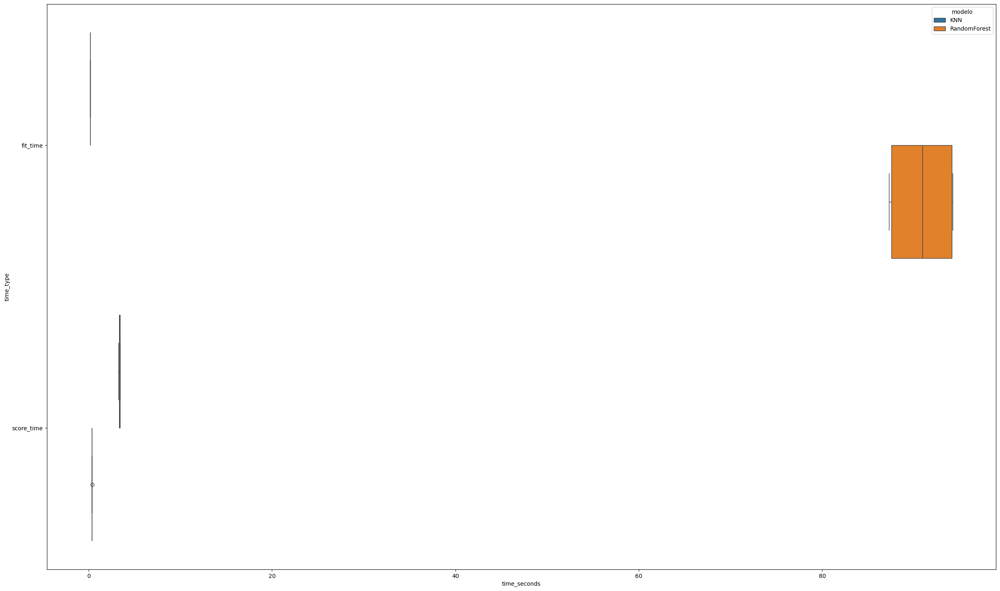

In [48]:
# BOXPLOT PARA TIMES
import matplotlib.pyplot as plt
plt.figure(figsize=(30, 18))
sns.boxplot(df_times, x='time_seconds', y='time_type', hue='modelo');

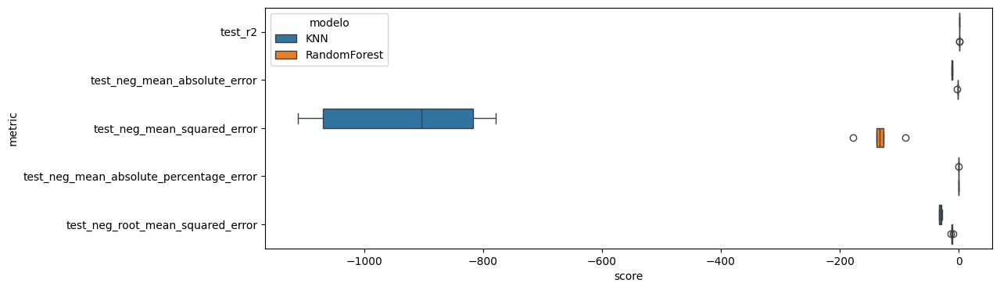

In [49]:
plt.figure(figsize=(12, 4))
sns.boxplot(df_scores, x='score', y='metric', hue='modelo');

# Clasificación

In [50]:
df_cla['instant_bookable'] = df_cla['instant_bookable'].astype('int')
df_e = df_cla.drop('room_type', axis=1)
df_room = df_cla['room_type']
df_cla.head()

,lat,long,construction_year,price,service_fee,minimum_nights,number_of_reviews,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,host_identity_verified,neighbourhood_group,neighbourhood,instant_bookable,cancellation_policy,room_type
0,40.64749,-73.97237,2020.0,966.0,193.0,10.0,9.0,0.21,4.0,6.0,286.0,unconfirmed,Brooklyn,Kensington,0,strict,Private room
1,40.75362,-73.98377,2007.0,142.0,28.0,13.0,45.0,0.38,4.0,2.0,228.0,verified,Manhattan,Midtown,0,moderate,Entire home/apt
2,40.80902,-73.94190,2005.0,620.0,124.0,3.0,0.0,0.79,5.0,1.0,352.0,unconfirmed,Manhattan,Harlem,1,flexible,Private room
3,40.68514,-73.95976,2005.0,368.0,74.0,13.0,270.0,4.64,4.0,1.0,322.0,unconfirmed,Brooklyn,Clinton Hill,1,moderate,Entire home/apt
4,40.79851,-73.94399,2009.0,204.0,41.0,10.0,9.0,0.10,3.0,1.0,289.0,verified,Manhattan,East Harlem,0,moderate,Entire home/apt


* Encoder

In [51]:
numerical_columns = df_e.select_dtypes(exclude=['object', 'category']).columns.to_list() # np.number alternativa
categorical_columns = df_e.select_dtypes(include=['object', 'category']).columns.to_list()

encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore') 
df_encoded = encoder.fit_transform(df_e[categorical_columns]) 

df = pd.concat(
    [
        pd.DataFrame(df_encoded, columns=encoder.get_feature_names_out()).reset_index(drop=True), # categoricas
        df_e[numerical_columns].reset_index(drop=True),
        df_room.reset_index(drop=True)
    ],
    axis=1
)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69305 entries, 0 to 69304
Columns: 262 entries, host_identity_verified_unconfirmed to room_type
dtypes: float64(260), int64(1), object(1)
memory usage: 138.5+ MB


<Axes: xlabel='room_type', ylabel='count'>

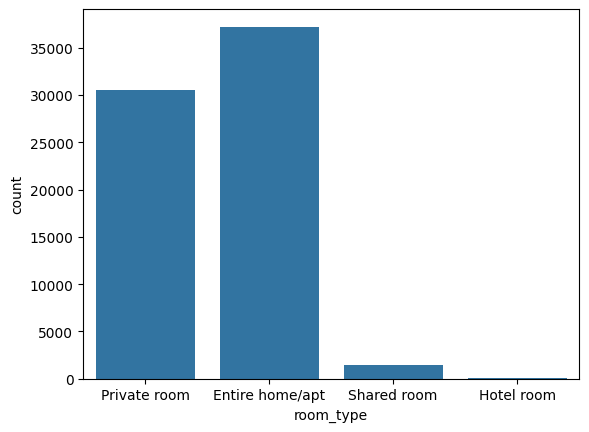

In [52]:
sns.countplot(df, x='room_type')

## Division de los datos

In [53]:
X= df.drop('room_type', axis=1)
y= df['room_type']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42, stratify=y)


In [54]:
print('Tamaño X_train', X_train.shape)
print('Distribución clases train:', Counter(y_train))
print('Tamaño X_test', X_test.shape)
print('Distribución clases test:', Counter(y_train))

Tamaño X_train (55444, 261)
Distribución clases train: Counter({'Entire home/apt': 29770, 'Private room': 24406, 'Shared room': 1176, 'Hotel room': 92})
Tamaño X_test (13861, 261)
Distribución clases test: Counter({'Entire home/apt': 29770, 'Private room': 24406, 'Shared room': 1176, 'Hotel room': 92})


In [55]:
df_resultados = pd.DataFrame(columns=['Modelo', 'accuracy', 'precision', 'recall', 'f1', 'AUC'])

def calculate_metrics(name, model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)
    
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')
    auc = roc_auc_score(y_test, y_pred_proba, multi_class='ovr')
    
    df_resultados.loc[len(df_resultados)] = [name, accuracy, precision, recall, f1, auc]

In [56]:
model = LogisticRegression(max_iter=10000, random_state=42)
calculate_metrics('Rlog', model, X_train, X_test, y_train, y_test)
df_resultados

c:\Users\user\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\user\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,Modelo,accuracy,precision,recall,f1,AUC
0,Rlog,0.604358,0.299558,0.305621,0.302215,0.672049


In [57]:
pca = PCA(n_components=10)
pca.fit(X_train)
varianza = np.cumsum(pca.explained_variance_ratio_)
print('varianza en cada componente', pca.explained_variance_ratio_)
print('varianza acumulada',varianza)

varianza en cada componente [8.37426598e-01 1.33330093e-01 2.01242506e-02 8.51469768e-03
 2.43584235e-04 1.81821400e-04 1.31954698e-04 1.35402617e-05
 1.13123196e-05 3.67997252e-06]
varianza acumulada [0.8374266  0.97075669 0.99088094 0.99939564 0.99963922 0.99982104
 0.999953   0.99996654 0.99997785 0.99998153]


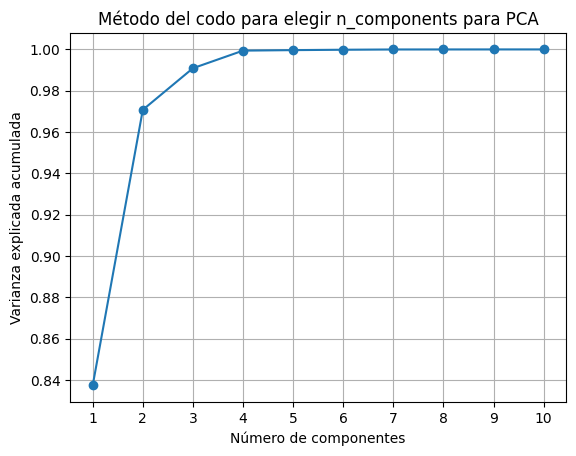

In [58]:
plt.plot(range(1, len(varianza) + 1), varianza, marker='o')
plt.xlabel("Número de componentes")
plt.ylabel("Varianza explicada acumulada")
plt.title('Método del codo para elegir n_components para PCA')
plt.xticks(range(1, len(varianza) + 1))
plt.grid()

In [59]:
pca = PCA(n_components=4)
X_train_pca = pca.fit_transform(X_train) 
X_test_pca = pca.transform(X_test)

In [60]:
import plotly.express as px

px.scatter_3d(
    x=X_train_pca[:, 0], # componente principal 1
    y=X_train_pca[:, 1], # componente principal 2
    z=X_train_pca[:, 2], # componente principal 3
    color=y_train,
    color_continuous_scale='viridis',
    title='PCA 3D iris',
    labels={
        'x': 'componente principal 1',
        'y': 'componente principal 2',
        'z': 'componente principal 3'
    }
)

In [61]:
model = LogisticRegression(max_iter=5000)
calculate_metrics('Rlog PCA', model, X_train_pca, X_test_pca, y_train, y_test)
df_resultados.sort_values('accuracy', ascending=False)

c:\Users\user\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,Modelo,accuracy,precision,recall,f1,AUC
0,Rlog,0.604358,0.299558,0.305621,0.302215,0.672049
1,Rlog PCA,0.536902,0.134226,0.250000,0.174670,0.565713


In [62]:
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

print('Tamaño X_train', X_train.shape)
print('Distribución clases y_train:', Counter(y_train))

print('\nTamaño X_train_resampled', X_train_smote.shape)
print('Distribución clases y_train_resampled:', Counter(y_train_smote))

Tamaño X_train (55444, 261)
Distribución clases y_train: Counter({'Entire home/apt': 29770, 'Private room': 24406, 'Shared room': 1176, 'Hotel room': 92})

Tamaño X_train_resampled (119080, 261)
Distribución clases y_train_resampled: Counter({'Entire home/apt': 29770, 'Private room': 29770, 'Shared room': 29770, 'Hotel room': 29770})


In [63]:
model = LogisticRegression(max_iter=5000)
calculate_metrics('Rlog Smote', model, X_train_smote, X_test, y_train_smote, y_test)
df_resultados.sort_values('accuracy', ascending=False)

c:\Users\user\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



,Modelo,accuracy,precision,recall,f1,AUC
0,Rlog,0.604358,0.299558,0.305621,0.302215,0.672049
1,Rlog PCA,0.536902,0.134226,0.250000,0.174670,0.565713
2,Rlog Smote,0.342400,0.294322,0.409422,0.229517,0.644438


In [64]:
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_pca, y_train)

print('Tamaño X_train', X_train_pca.shape)
print('Distribución clases y_train:', Counter(y_train))

print('\nTamaño X_train_resampled', X_train_smote.shape)
print('Distribución clases y_train_resampled:', Counter(y_train_smote))

Tamaño X_train (55444, 4)
Distribución clases y_train: Counter({'Entire home/apt': 29770, 'Private room': 24406, 'Shared room': 1176, 'Hotel room': 92})

Tamaño X_train_resampled (119080, 4)
Distribución clases y_train_resampled: Counter({'Entire home/apt': 29770, 'Private room': 29770, 'Shared room': 29770, 'Hotel room': 29770})


In [65]:
model = LogisticRegression(max_iter=5000)
calculate_metrics('Rlog Smote PCA', model, X_train_smote, X_test_pca, y_train_smote, y_test)
df_resultados.sort_values('accuracy', ascending=False)

,Modelo,accuracy,precision,recall,f1,AUC
0,Rlog,0.604358,0.299558,0.305621,0.302215,0.672049
1,Rlog PCA,0.536902,0.134226,0.250000,0.174670,0.565713
2,Rlog Smote,0.342400,0.294322,0.409422,0.229517,0.644438
3,Rlog Smote PCA,0.218960,0.257854,0.398136,0.146076,0.571999


In [66]:
model = KNeighborsClassifier()
calculate_metrics('KNN 5', model, X_train, X_test, y_train, y_test)
df_resultados.sort_values('accuracy', ascending=False)

,Modelo,accuracy,precision,recall,f1,AUC
0,Rlog,0.604358,0.299558,0.305621,0.302215,0.672049
1,Rlog PCA,0.536902,0.134226,0.250000,0.174670,0.565713
4,KNN 5,0.529760,0.260819,0.266430,0.263028,0.547152
2,Rlog Smote,0.342400,0.294322,0.409422,0.229517,0.644438
3,Rlog Smote PCA,0.218960,0.257854,0.398136,0.146076,0.571999


In [67]:
model = DecisionTreeClassifier()
calculate_metrics('DTC', model, X_train, X_test, y_train, y_test)
df_resultados.sort_values('accuracy', ascending=False)

,Modelo,accuracy,precision,recall,f1,AUC
5,DTC,0.637472,0.560850,0.484503,0.510097,0.655003
0,Rlog,0.604358,0.299558,0.305621,0.302215,0.672049
1,Rlog PCA,0.536902,0.134226,0.250000,0.174670,0.565713
4,KNN 5,0.529760,0.260819,0.266430,0.263028,0.547152
2,Rlog Smote,0.342400,0.294322,0.409422,0.229517,0.644438
3,Rlog Smote PCA,0.218960,0.257854,0.398136,0.146076,0.571999


In [68]:
model = RandomForestClassifier()
calculate_metrics('RFC', model, X_train, X_test, y_train, y_test)
df_resultados.sort_values('accuracy', ascending=False)

c:\Users\user\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,Modelo,accuracy,precision,recall,f1,AUC
6,RFC,0.702186,0.580703,0.376527,0.390858,0.803291
5,DTC,0.637472,0.560850,0.484503,0.510097,0.655003
0,Rlog,0.604358,0.299558,0.305621,0.302215,0.672049
1,Rlog PCA,0.536902,0.134226,0.250000,0.174670,0.565713
4,KNN 5,0.529760,0.260819,0.266430,0.263028,0.547152
2,Rlog Smote,0.342400,0.294322,0.409422,0.229517,0.644438
3,Rlog Smote PCA,0.218960,0.257854,0.398136,0.146076,0.571999


In [69]:
# model = SVC(probability=True)
# calculate_metrics('SVC', model, X_train, X_test, y_train, y_test)
# df_resultados

Comentado porque tarda mucho
![alt text](image-1.png)


* Validación cruzada

In [ ]:
from sklearn.model_selection import cross_val_score


model = LogisticRegression(max_iter=5000, random_state=42)
results = cross_val_score(model, X_train, y_train, cv=5, scoring='accuracy')
print('accuracy cv', results.mean())

model.fit(X_train, y_train)
y_pred = model.predict(X_test)

print('accuracy test', accuracy_score(y_test, y_pred))

c:\Users\user\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\user\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logis

accuracy cv 0.6023916083265438


In [ ]:
models = {
    'LogisticRegression': LogisticRegression(max_iter=100, random_state=42),
    'KNN': KNeighborsClassifier(),
    'DTC': DecisionTreeClassifier(),
    'RandomForest': RandomForestClassifier()
}

df_list = []
for name, model in models.items(): 
    
    results = cross_validate(model, X, y, cv=5, scoring=['accuracy', 'precision_macro', 'recall_macro', 'f1_macro', 'roc_auc_ovr'])
    df_model = pd.DataFrame(results)
    df_model['modelo'] = name
    df_list.append(df_model)

df_resultados = pd.concat(df_list, ignore_index=True)
df_resultados.sort_values('accuracy', ascending=False)

In [ ]:
df_pivot = df_resultados.groupby('modelo').mean().sort_values('test_f1_macro', ascending=False)
df_pivot

In [ ]:
sns.heatmap(df_pivot.drop(columns=['fit_time','score_time']), annot=True, cmap='viridis')

In [ ]:
# dividir en dos dataframes, unos para times y otro para scores
df_resultados_times = df_resultados[['modelo', 'fit_time', 'score_time']]
df_resultados_scores = df_resultados[['modelo', 'test_accuracy', 'test_precision_macro', 'test_recall_macro', 'test_f1_macro', 'test_roc_auc_ovr']]

In [ ]:
# DATAFRAMES DE TIMES
df_times = df_resultados_times.melt(id_vars='modelo', var_name='time_type', value_name='time_seconds')
df_times.head(3)

In [ ]:
# DATAFRAMES DE SCORES
df_scores = df_resultados_scores.melt(id_vars='modelo', var_name='metric', value_name='score')
df_scores.head(3)

In [ ]:
# BOXPLOT PARA TIMES
import matplotlib.pyplot as plt
plt.figure(figsize=(30, 18))
sns.boxplot(df_times, x='time_seconds', y='time_type', hue='modelo');

In [ ]:
plt.figure(figsize=(12, 8))
sns.boxplot(df_scores, x='metric', y='score', hue='modelo');

# Pipelines

## Regresion

In [ ]:
df = pd.read_csv('airbnb_nyc_clean.csv')
df = df.drop(['id','name','host_id','host_name','last_review', 'house_rules'], axis=1)
numerical_col = df.select_dtypes(include=[np.number]).columns
categorical_col = df.select_dtypes(exclude=[np.number]).columns
df_cla = df.copy()

In [ ]:
X = df.drop(['price'], axis=1)
y = df['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [ ]:
df_resultados = pd.DataFrame(columns=['Modelo','R2', 'MAE', 'RMSE', 'MAPE'])

pipeline_categorical = Pipeline([
                ('imputer', SimpleImputer(strategy='most_frequent')),
                ('encoder', OneHotEncoder(handle_unknown='ignore')),
            ])

pipeline_numerical = Pipeline([
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('scaler', StandardScaler()),
])
pipeline_all = ColumnTransformer([
    ('numeric', pipeline_numerical, numerical_col),
    ('categorical', pipeline_categorical, categorical_col)
])
pipeline = Pipeline([
    ('pipeline', pipeline_all),
    ('modelo', LinearRegression())]
)
pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)

r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = root_mean_squared_error(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)
df_resultados.loc[len(df_resultados)] = [f'LR ', r2, mae, rmse, mape]

df_resultados

In [ ]:
escaladores = {
    'None' : None,
    'StandarS':StandardScaler(),
    'MinMaxS':MinMaxScaler(),
    'RobustS':RobustScaler(),
}

transformadores = {
    'None' : None,
    'PowerT':PowerTransformer(),
    'QuantileT':QuantileTransformer()
}

modelos = {
    'LR' : LinearRegression(),
    'KNN' : KNeighborsRegressor(),
    'CART' : DecisionTreeRegressor(random_state=42),
}

In [ ]:
df_resultados = pd.DataFrame(columns=['Modelo','R2', 'MAE', 'RMSE', 'MAPE'])

pipeline_categorical = Pipeline([
                ('imputer', SimpleImputer(strategy='most_frequent')),
                ('encoder', OneHotEncoder(handle_unknown='ignore')),
            ])
for nombre_escalador, escalador in escaladores.items():
    for nombre_modelo, modelo in modelos.items():
        for nombre_transformador, transformador in transformadores.items():
            if escalador == None and transformador != None:
                pass
            else:
                pipeline_numerical = Pipeline([
                    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
                    ('scaler', escalador),
                    ('transformer', transformador),
                ])
                pipeline_all = ColumnTransformer([
                    ('numeric', pipeline_numerical, numerical_col),
                    ('categorical', pipeline_categorical, categorical_col)
                ])
                pipeline = Pipeline([
                    ('pipeline', pipeline_all),
                    ('modelo', modelo)]
                )
                pipeline.fit(X_train, y_train)
                y_pred = pipeline.predict(X_test)

                r2 = r2_score(y_test, y_pred)
                mae = mean_absolute_error(y_test, y_pred)
                rmse = root_mean_squared_error(y_test, y_pred)
                mape = mean_absolute_percentage_error(y_test, y_pred)
                df_resultados.loc[len(df_resultados)] = [f'{nombre_escalador} {nombre_transformador} {nombre_modelo}', r2, mae, rmse, mape]
                print(f'{nombre_escalador} {nombre_transformador} {nombre_modelo}')
        
df_resultados.sort_values('R2', ascending=False)